In [1]:
! git clone https://github.com/praveenVnktsh/Panorama-Stitching.git

Cloning into 'Panorama-Stitching'...
remote: Enumerating objects: 373, done.
remote: Counting objects: 100% (369/369), done.
remote: Compressing objects: 100% (299/299), done.
remote: Total 373 (delta 64), reused 369 (delta 64), pack-reused 4 (from 1)
Receiving objects: 100% (373/373), 575.54 MiB | 26.82 MiB/s, done.
Resolving deltas: 100% (64/64), done.


In [2]:
%cd Panorama-Stitching

/content/Panorama-Stitching


In [3]:
! rm -r outputs

In [4]:
!mkdir -p outputs

In [9]:
! python /content/Panorama-Stitching/main.py

Original image size =  (1329, 2000, 3)
Totally 226 matches
100% 5000/5000 [00:03<00:00, 1311.31it/s]
Max inliers =  28
Original image size =  (1329, 2000, 3)
Totally 208 matches
100% 5000/5000 [00:02<00:00, 1803.39it/s]
Max inliers =  25
Original image size =  (1329, 2000, 3)
Totally 500 matches
100% 5000/5000 [00:02<00:00, 1837.26it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 218 matches
100% 5000/5000 [00:03<00:00, 1455.17it/s]
Max inliers =  27
Original image size =  (1329, 2000, 3)
Totally 217 matches
100% 5000/5000 [00:02<00:00, 1805.27it/s]
Max inliers =  22
blending 1
blending 2
blending 3
blending 4


In [10]:
!ls outputs/

l4


In [11]:
import matplotlib.pyplot as plt
import cv2

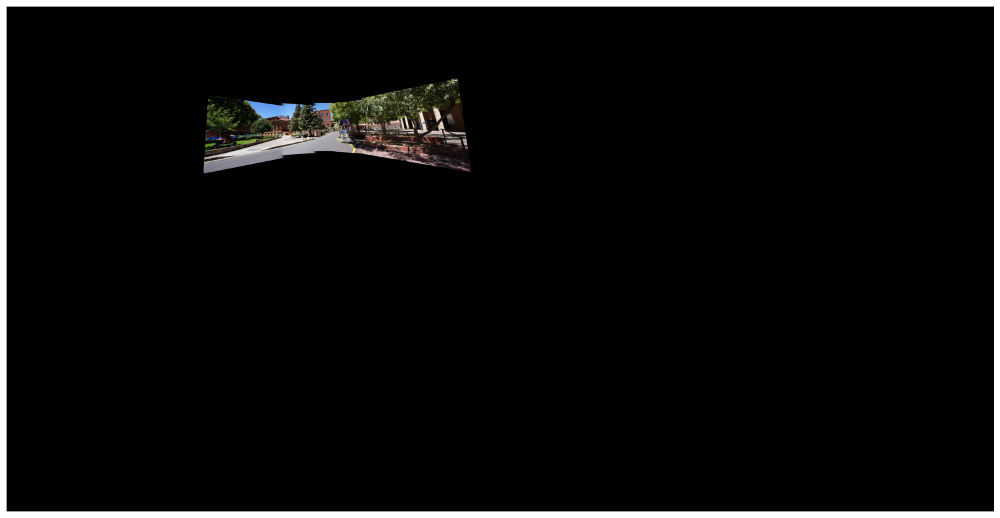

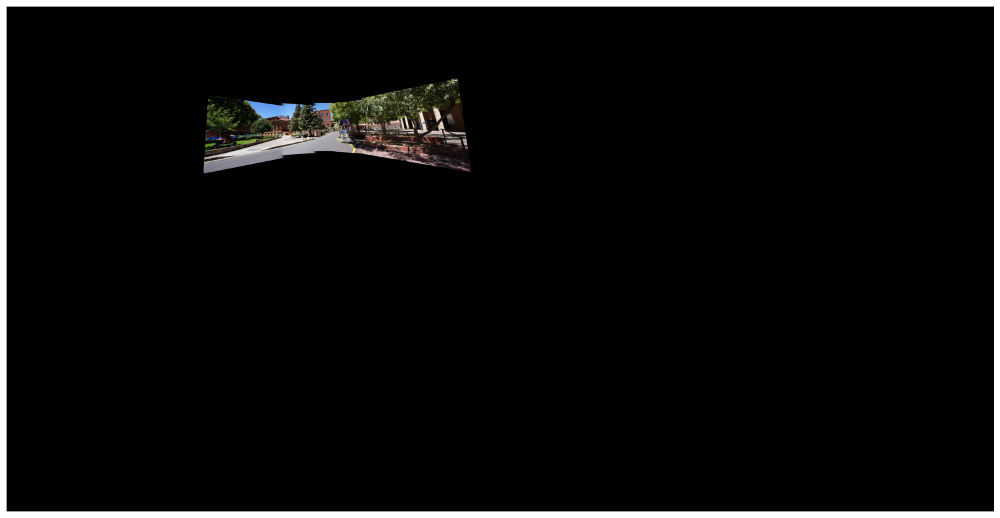

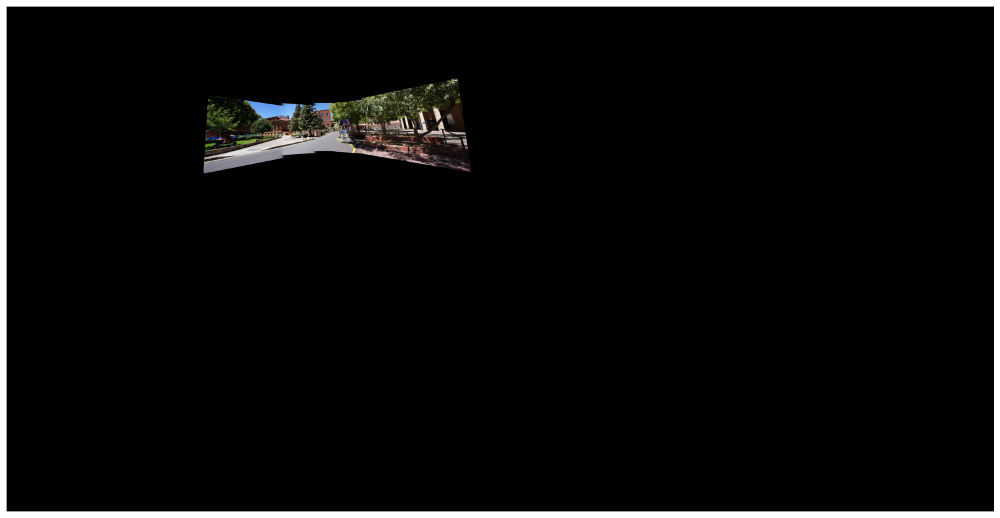

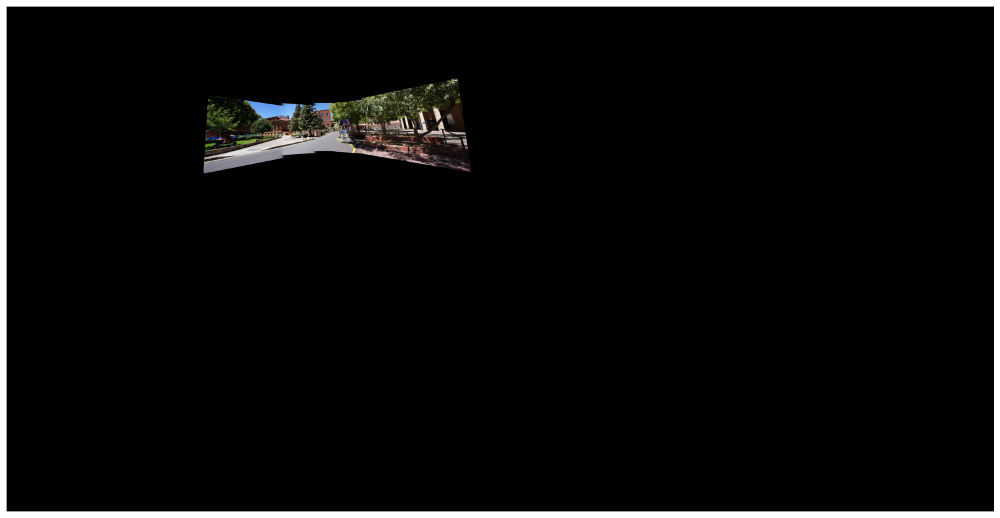

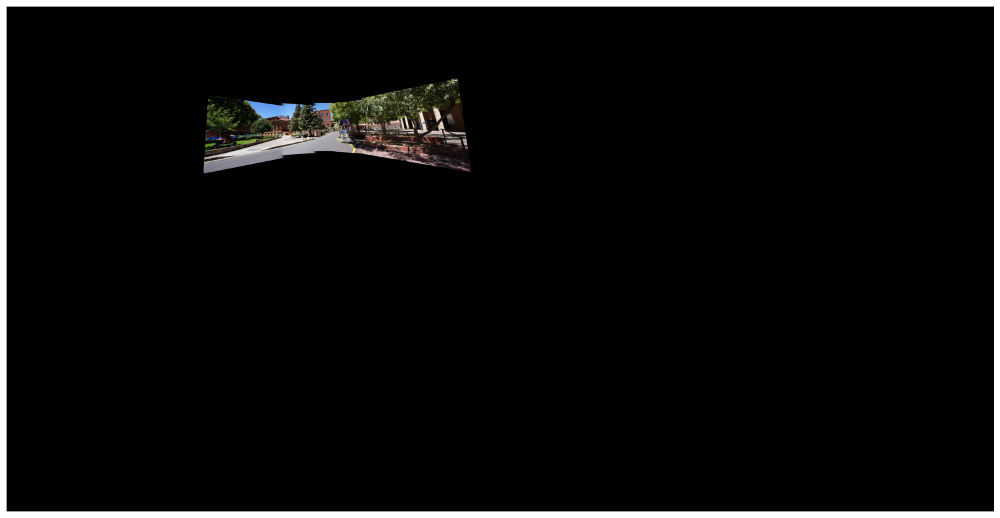

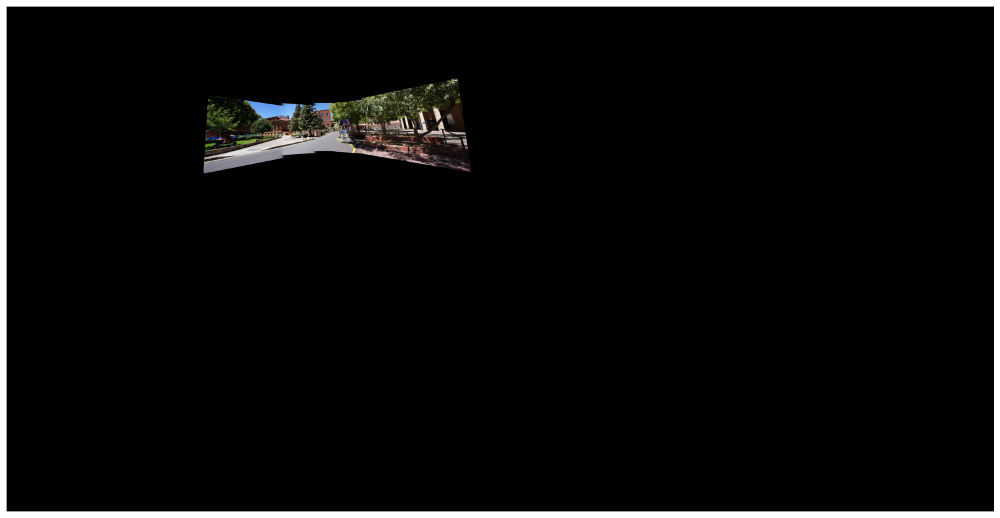

In [13]:
for i in range(1, 7):
    panorama = cv2.imread(f'outputs/l4/custom/FINALBLENDED.png')
    panorama = cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20,10))
    plt.imshow(panorama)
    plt.axis('off')
    plt.show()

- Feature Detection: Replace ORB with DoG or FAST + Harris, depending on performance requirements.


- Feature Description: Use SIFT or custom patch descriptors to create more accurate representations of keypoints.
- Feature Matching: Implement NNDR using a KD Tree to improve the speed of feature matching.
- Homography Optimization: Use geometric minimization alongside RANSAC to refine homography matrix estimation.
- Blending: Consider different blending techniques like pyramid blending or seam carving to improve final panorama quality.

In [26]:
%%writefile main_SIFT_DOG.py
from blending import Blender
import glob
import cv2
import numpy as np
import os
from tqdm import tqdm
import argparse

def detectFeaturesAndMatch(img1, img2, nFeaturesReturn=30):
    '''
    Uses SIFT for feature detection and BFMatcher for feature matching.
    '''
    # Initialize SIFT detector (using DoG)
    sift = cv2.SIFT_create()

    # Detect keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # Brute force matcher with L2 norm (recommended for SIFT)
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    # Match descriptors
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    correspondences = []
    for match in matches:
        correspondences.append((kp1[match.queryIdx].pt, kp2[match.trainIdx].pt))

    print('Totally', len(correspondences), 'matches')

    src = np.float32([m[0] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)
    dst = np.float32([m[1] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)

    return np.array(correspondences[:nFeaturesReturn]), src, dst


def getHomography(matches):
    '''
    Takes in the points of correspondences and returns the homography matrix by
    solving for the best fit transform using SVD.
    '''
    A = np.zeros((2*len(matches), 9))
    for i, match in enumerate(matches):
        src = match[0]
        dst = match[1]
        x1 = src[0]
        x2 = dst[0]
        y1 = src[1]
        y2 = dst[1]
        A[2*i] = np.array([x1, y1, 1, 0, 0, 0, -x1*x2, -y1*x2, -x2])
        A[2*i+1] = np.array([0, 0, 0, x1, y1, 1, -x1*y2, -y1*y2, -y2])

    U, S, V = np.linalg.svd(A)
    H = np.reshape(V[-1], (3, 3) )
    return H

def getBestHomographyRANSAC(matches, trials = 10000, threshold = 10, toChooseSamples = 4):
    '''
    Applies the RANSAC algorithm and tries out different homography matrices to compute the best matrix.
    '''
    finalH = None
    nMaxInliers = 0
    randomSample = None
    for trialIndex in tqdm(range(trials)):
        inliers = []
        # randomly sample from the correspondences, and then compute homography matrix
        # after finding homography, see if the number of inliers is the best so far. If yes, we take that homography.
        # the number of correspondences for which we can compute the homography is a parameter.
        randomSample = matches[np.random.choice(len(matches), size=toChooseSamples, replace=False)]
        H = getHomography(randomSample)
        for match in matches:
            src = np.append(match[0], 1).T
            dst = np.append(match[1], 1).T
            transformed = np.dot(H, src)
            transformed /= transformed[2]
            if np.linalg.norm(transformed - dst) < threshold:
                inliers.append(match)

        # best match => store
        if len(inliers) > nMaxInliers:
            nMaxInliers = len(inliers)
            finalH = H
    print('Max inliers = ', nMaxInliers)
    return finalH, randomSample

def transformPoint(i, j, H):
    '''
    Helper function that simply transforms the point according to a given homography matrix
    '''
    transformed = np.dot(H, np.array([i, j, 1]))
    transformed /= transformed[2]
    transformed = transformed.astype(int)[:2]
    return np.array(transformed)

def transformImage(img, H, dst, forward = False, offset = [0, 0]):
    '''
    Helper function that computes the transformed image after applying homography.
    '''
    h, w, _ = img.shape
    if forward:
        # direct conversion from image to warped image without gap filling.
        coords = np.indices((w, h)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)
        transformedPoints = np.dot(H, coords)
        yo, xo = coords[1, :], coords[0, :]
        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)
        dst[yt + offset[1], xt + offset[0]] = img[yo, xo]
    else:
        # applies inverse sampling to prevent any aliasing and hole effects in output image.
        Hinv = np.linalg.inv(H)
        topLeft = transformPoint(0, 0, H)
        topRight = transformPoint(w-1, 0, H)
        bottomLeft = transformPoint(0, h-1, H)
        bottomRight = transformPoint(w-1, h-1, H)
        box = np.array([topLeft, topRight, bottomLeft, bottomRight])
        minX = np.min(box[:, 0])
        maxX = np.max(box[:, 0])
        minY = np.min(box[:, 1])
        maxY = np.max(box[:, 1])
        # instead of iterating through the pixels, we take indices and do
        # H.C, where C = coordinates to get the transformed pixels.
        coords = np.indices((maxX - minX, maxY - minY)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)

        coords[0, :] += minX
        coords[1, :] += minY
        # here, we use the inverse transformation from the transformed bounding box to compute the pixel value of the transformed image.
        transformedPoints = np.dot(Hinv, coords)
        yo, xo = coords[1, :], coords[0, :]

        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)


        # to prevent out of range errors
        indices = np.where((yt >= 0) & (yt < h) & (xt >= 0) & (xt < w))

        xt = xt[indices]
        yt = yt[indices]

        xo = xo[indices]
        yo = yo[indices]

        height, width = dst.shape[:2]  # Get the dimensions of the destination image

        if (0 <= (yo + offset[1])).all() and (yo + offset[1] < height).all() and \
        (0 <= (xo + offset[0])).all() and (xo + offset[0] < width).all():
            dst[yo + offset[1], xo + offset[0]] = img[yt, xt]


def execute(index1, index2, prevH):
    '''
    Computes the best homography and saves the warped images to the outputs_DOG directory.
    '''
    warpedImage = np.zeros((4192, 8192, 3))
    img1 = cv2.imread(imagePaths[index1])
    img2 = cv2.imread(imagePaths[index2])
    print('Original image size = ', img1.shape)
    img1 = cv2.resize(img1, shape)
    img2 = cv2.resize(img2, shape)

    # Feature detection and matching using DoG-based SIFT
    matches, src, dst = detectFeaturesAndMatch(img2, img1)

    # RANSAC for homography
    H, subsetMatches = getBestHomographyRANSAC(matches, trials=trials, threshold=threshold)
    prevH = np.dot(prevH, H)

    # Apply the homography transformation
    transformImage(img2, prevH, dst=warpedImage, offset=offset)

    # Save the warped image in the outputs_DOG directory
    cv2.imwrite(f'outputs/l{imageSet}/DOG/warped_{index2}.png', warpedImage)

    return prevH



if __name__ == "__main__":
    parser = argparse.ArgumentParser(description="Panorama Stitching Script")

    # Add an argument for the image set number
    parser.add_argument('imageSet', type=int, help="The image set number to process")

    # Parse the arguments
    args = parser.parse_args()

    # Assign the image set number from the argument
    imageSet = args.imageSet

    imagePaths = sorted(glob.glob('dataset/I' + str(imageSet) + '/*'))
    # Update paths to 'outputs_DOG'
    os.makedirs(f'outputs/l{imageSet}/DOG', exist_ok=True)

    shape = (600, 400) # Resize for performance
    mid = len(imagePaths) // 2

    threshold = 2
    trials = 5000
    offset = [2300, 800]

    prevH = np.eye(3)
    prevH = execute(2, 1, prevH)
    prevH = execute(1, 0, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 2, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 3, prevH)
    prevH = execute(3, 4, prevH)

    if imageSet == 1:
        prevH = execute(4, 5, prevH)

    # Blending
    b = Blender()
    finalImg = cv2.imread(f'outputs/l{imageSet}/DOG/warped_0.png')
    length = 6 if imageSet == 1 else 5
    for index in range(1, length):
        print('Blending', index)
        img2 = cv2.imread(f'outputs/l{imageSet}/DOG/warped_{index}.png')
        finalImg, mask1truth, mask2truth = b.blend(finalImg, img2)
        mask1truth = mask1truth + mask2truth

    cv2.imwrite(f'outputs/l{imageSet}/DOG/FINALBLENDED.png', finalImg)



Overwriting feature_detection_comparison.py


In [ ]:
!python3 main_SIFT_DOG.py 4

In [30]:
!python3 main_SIFT_DOG.py 5

Original image size =  (1329, 2000, 3)
Totally 753 matches
100% 5000/5000 [00:02<00:00, 1902.13it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 578 matches
100% 5000/5000 [00:02<00:00, 1865.54it/s]
Max inliers =  24
Original image size =  (1329, 2000, 3)
Totally 1806 matches
100% 5000/5000 [00:03<00:00, 1462.33it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 959 matches
100% 5000/5000 [00:02<00:00, 1864.06it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 1010 matches
100% 5000/5000 [00:03<00:00, 1521.38it/s]
Max inliers =  30
Blending 1
Blending 2
Blending 3
Blending 4


In [27]:
!python3 main_SIFT_DOG.py 1

Original image size =  (2448, 3264, 3)
Totally 604 matches
100% 5000/5000 [00:02<00:00, 1910.77it/s]
Max inliers =  15
Original image size =  (2448, 3264, 3)
Totally 493 matches
100% 5000/5000 [00:02<00:00, 1863.74it/s]
Max inliers =  22
Original image size =  (2448, 3264, 3)
Totally 1614 matches
100% 5000/5000 [00:03<00:00, 1550.61it/s]
Max inliers =  30
Original image size =  (2448, 3264, 3)
Totally 555 matches
100% 5000/5000 [00:02<00:00, 1859.30it/s]
Max inliers =  20
Original image size =  (2448, 3264, 3)
Totally 507 matches
100% 5000/5000 [00:03<00:00, 1657.25it/s]
Max inliers =  27
Original image size =  (2448, 3264, 3)
Totally 436 matches
100% 5000/5000 [00:02<00:00, 1784.32it/s]
Max inliers =  30
Blending 1
Blending 2
Blending 3
Blending 4
Blending 5


In [21]:
def print_normal(image_path):
    panorama = cv2.imread(image_path)
    panorama = cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20,10))
    plt.imshow(panorama)
    plt.axis('off')
    plt.show()

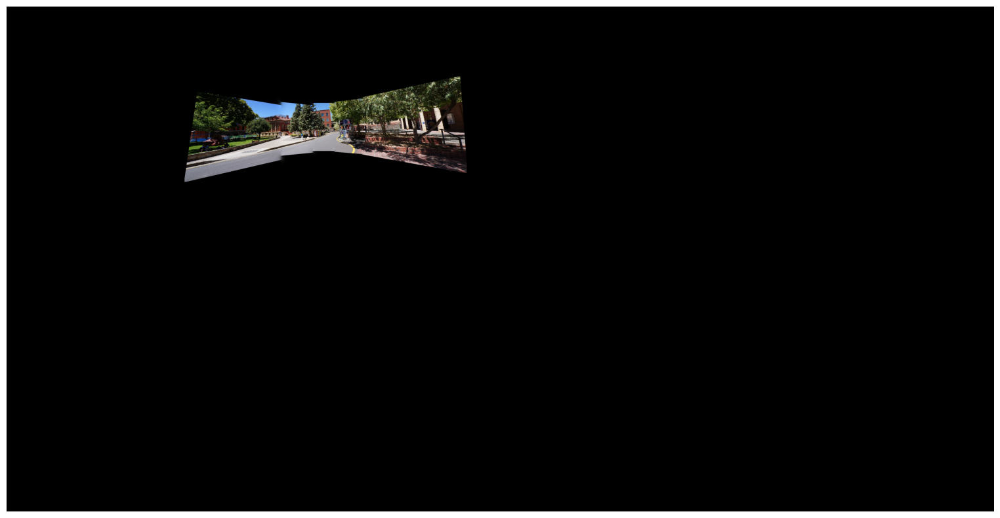

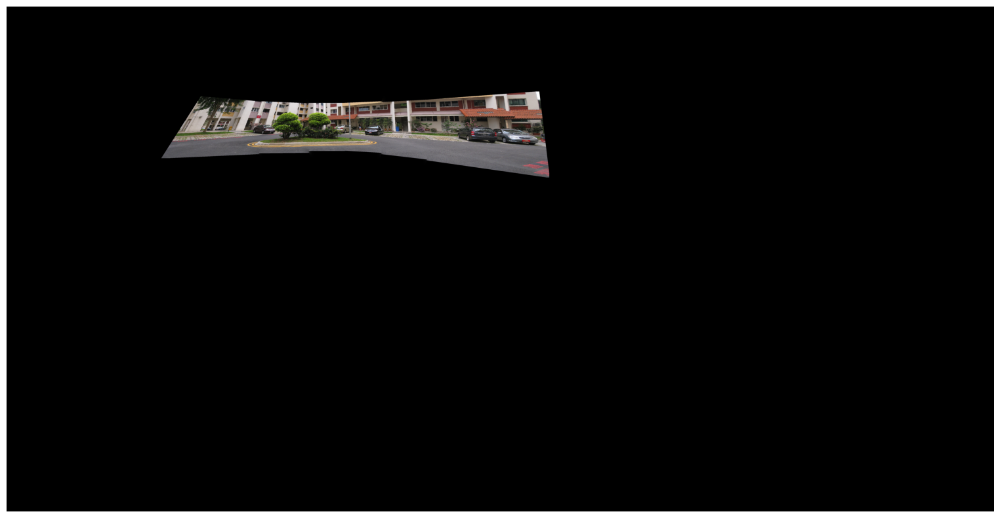

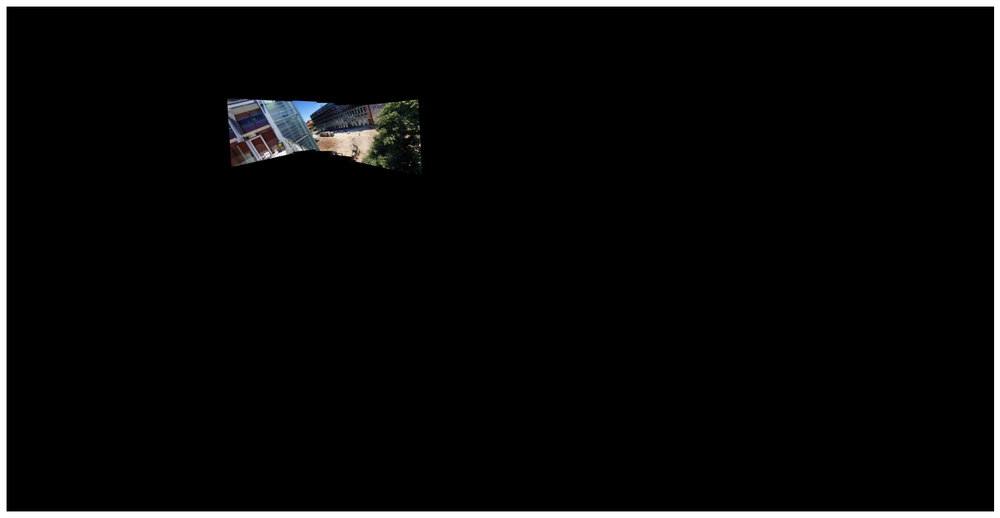

In [31]:
print_normal("outputs/l4/DOG/FINALBLENDED.png")
print_normal("outputs/l1/DOG/FINALBLENDED.png")
print_normal("outputs/l5/DOG/FINALBLENDED.png")

In [19]:
def print_big(image_path):
    panorama = cv2.imread(image_path)
    panorama = cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)

    # Convert the image to grayscale to find non-black areas
    gray_image = cv2.cvtColor(panorama, cv2.COLOR_RGB2GRAY)

    # Find all non-black pixels
    non_black_pixels = cv2.findNonZero(gray_image)

    if non_black_pixels is not None:
        # Get the bounding box of non-black pixels
        x, y, w, h = cv2.boundingRect(non_black_pixels)

        # Set up figure for plotting
        plt.figure(figsize=(20, 10))
        plt.imshow(panorama)

        # Zoom into the region where the image has content
        plt.xlim(x, x + w)
        plt.ylim(y + h, y)

        plt.axis('off')
        plt.show()
    else:
        print("No non-black pixels found.")


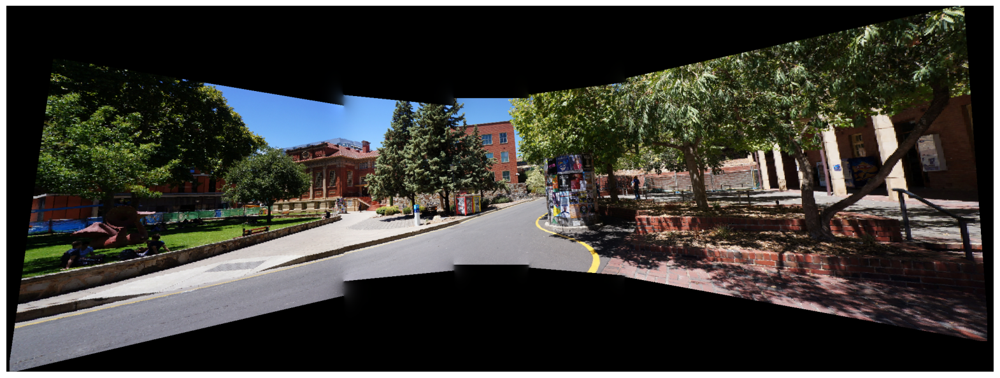

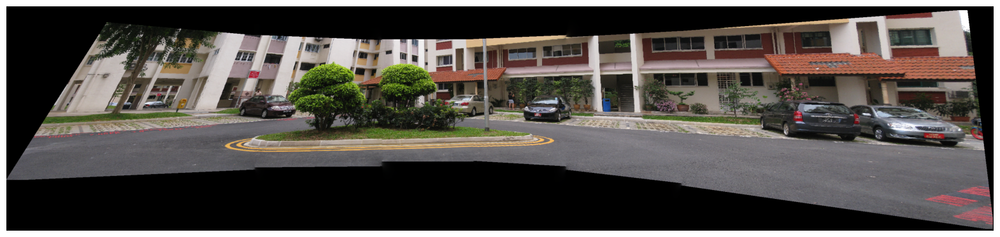

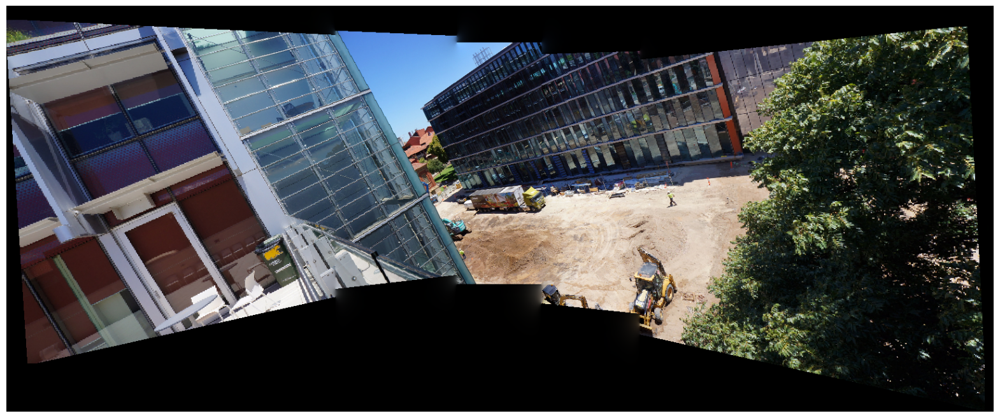

In [32]:
print_big("outputs/l4/DOG/FINALBLENDED.png")
print_big("outputs/l1/DOG/FINALBLENDED.png")
print_big("outputs/l5/DOG/FINALBLENDED.png")

In [37]:
%%writefile main_FAST_Harris.py
from blending import Blender
import glob
import cv2
import numpy as np
import os
from tqdm import tqdm
import argparse

def detectFeaturesAndMatch(img1, img2, nFeaturesReturn=30):
    '''
    Detects features using FAST and Harris, and matches between the two images using ORB for descriptors.
    '''
    # Initiate FAST detector
    fast = cv2.FastFeatureDetector_create()
    kp1 = fast.detect(img1, None)
    kp2 = fast.detect(img2, None)

    # Convert keypoints to corner features using Harris corner detection
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    harris_corners1 = cv2.cornerHarris(img1_gray, 2, 3, 0.04)
    harris_corners2 = cv2.cornerHarris(img2_gray, 2, 3, 0.04)

    # Extract keypoints near strong corners using Harris response
    kp1 = [kp for kp in kp1 if harris_corners1[int(kp.pt[1]), int(kp.pt[0])] > 0.01 * harris_corners1.max()]
    kp2 = [kp for kp in kp2 if harris_corners2[int(kp.pt[1]), int(kp.pt[0])] > 0.01 * harris_corners2.max()]

    # Use ORB for descriptor extraction
    orb = cv2.ORB_create()
    kp1, des1 = orb.compute(img1, kp1)
    kp2, des2 = orb.compute(img2, kp2)

    # Matching using Brute Force matcher
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    correspondences = []
    for match in matches:
        correspondences.append((kp1[match.queryIdx].pt, kp2[match.trainIdx].pt))

    print('Totally', len(correspondences), 'matches')
    src = np.float32([m[0] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)
    dst = np.float32([m[1] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)

    return np.array(correspondences[:nFeaturesReturn]), src, dst



def getHomography(matches):
    '''
    Takes in the points of correspondences and returns the homography matrix by
    solving for the best fit transform using SVD.
    '''
    A = np.zeros((2*len(matches), 9))
    for i, match in enumerate(matches):
        src = match[0]
        dst = match[1]
        x1 = src[0]
        x2 = dst[0]
        y1 = src[1]
        y2 = dst[1]
        A[2*i] = np.array([x1, y1, 1, 0, 0, 0, -x1*x2, -y1*x2, -x2])
        A[2*i+1] = np.array([0, 0, 0, x1, y1, 1, -x1*y2, -y1*y2, -y2])

    U, S, V = np.linalg.svd(A)
    H = np.reshape(V[-1], (3, 3) )
    return H

def getBestHomographyRANSAC(matches, trials = 10000, threshold = 10, toChooseSamples = 4):
    '''
    Applies the RANSAC algorithm and tries out different homography matrices to compute the best matrix.
    '''
    finalH = None
    nMaxInliers = 0
    randomSample = None
    for trialIndex in tqdm(range(trials)):
        inliers = []
        # randomly sample from the correspondences, and then compute homography matrix
        # after finding homography, see if the number of inliers is the best so far. If yes, we take that homography.
        # the number of correspondences for which we can compute the homography is a parameter.
        randomSample = matches[np.random.choice(len(matches), size=toChooseSamples, replace=False)]
        H = getHomography(randomSample)
        for match in matches:
            src = np.append(match[0], 1).T
            dst = np.append(match[1], 1).T
            transformed = np.dot(H, src)
            transformed /= transformed[2]
            if np.linalg.norm(transformed - dst) < threshold:
                inliers.append(match)

        # best match => store
        if len(inliers) > nMaxInliers:
            nMaxInliers = len(inliers)
            finalH = H
    print('Max inliers = ', nMaxInliers)
    return finalH, randomSample

def transformPoint(i, j, H):
    '''
    Helper function that simply transforms the point according to a given homography matrix
    '''
    transformed = np.dot(H, np.array([i, j, 1]))
    transformed /= transformed[2]
    transformed = transformed.astype(int)[:2]
    return np.array(transformed)

def transformImage(img, H, dst, forward = False, offset = [0, 0]):
    '''
    Helper function that computes the transformed image after applying homography.
    '''
    h, w, _ = img.shape
    if forward:
        # direct conversion from image to warped image without gap filling.
        coords = np.indices((w, h)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)
        transformedPoints = np.dot(H, coords)
        yo, xo = coords[1, :], coords[0, :]
        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)
        dst[yt + offset[1], xt + offset[0]] = img[yo, xo]
    else:
        # applies inverse sampling to prevent any aliasing and hole effects in output image.
        Hinv = np.linalg.inv(H)
        topLeft = transformPoint(0, 0, H)
        topRight = transformPoint(w-1, 0, H)
        bottomLeft = transformPoint(0, h-1, H)
        bottomRight = transformPoint(w-1, h-1, H)
        box = np.array([topLeft, topRight, bottomLeft, bottomRight])
        minX = np.min(box[:, 0])
        maxX = np.max(box[:, 0])
        minY = np.min(box[:, 1])
        maxY = np.max(box[:, 1])
        # instead of iterating through the pixels, we take indices and do
        # H.C, where C = coordinates to get the transformed pixels.
        coords = np.indices((maxX - minX, maxY - minY)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)

        coords[0, :] += minX
        coords[1, :] += minY
        # here, we use the inverse transformation from the transformed bounding box to compute the pixel value of the transformed image.
        transformedPoints = np.dot(Hinv, coords)
        yo, xo = coords[1, :], coords[0, :]

        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)


        # to prevent out of range errors
        indices = np.where((yt >= 0) & (yt < h) & (xt >= 0) & (xt < w))

        xt = xt[indices]
        yt = yt[indices]

        xo = xo[indices]
        yo = yo[indices]

        height, width = dst.shape[:2]  # Get the dimensions of the destination image

        if (0 <= (yo + offset[1])).all() and (yo + offset[1] < height).all() and \
        (0 <= (xo + offset[0])).all() and (xo + offset[0] < width).all():
            dst[yo + offset[1], xo + offset[0]] = img[yt, xt]


def execute(index1, index2, prevH):
    '''
    Computes the best homography and saves the warped images to the outputs_DOG directory.
    '''
    warpedImage = np.zeros((4192, 8192, 3))
    img1 = cv2.imread(imagePaths[index1])
    img2 = cv2.imread(imagePaths[index2])
    print('Original image size = ', img1.shape)
    img1 = cv2.resize(img1, shape)
    img2 = cv2.resize(img2, shape)

    # Feature detection and matching using DoG-based SIFT
    matches, src, dst = detectFeaturesAndMatch(img2, img1)

    # RANSAC for homography
    H, subsetMatches = getBestHomographyRANSAC(matches, trials=trials, threshold=threshold)
    prevH = np.dot(prevH, H)

    # Apply the homography transformation
    transformImage(img2, prevH, dst=warpedImage, offset=offset)

    # Save the warped image in the outputs_DOG directory
    cv2.imwrite(f'outputs/l{imageSet}/FAST_Harris/warped_{index2}.png', warpedImage)

    return prevH



if __name__ == "__main__":
    parser = argparse.ArgumentParser(description="Panorama Stitching Script")

    # Add an argument for the image set number
    parser.add_argument('imageSet', type=int, help="The image set number to process")

    # Parse the arguments
    args = parser.parse_args()

    # Assign the image set number from the argument
    imageSet = args.imageSet

    imagePaths = sorted(glob.glob('dataset/I' + str(imageSet) + '/*'))
    os.makedirs('outputs/l' + str(imageSet) + '/FAST_Harris/', exist_ok=True)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    shape = (600, 400)
    mid = len(imagePaths)//2

    threshold = 2
    trials = 5000
    offset = [2300, 800]

    prevH = np.eye(3)
    prevH = execute(2, 1, prevH)
    prevH = execute(1, 0, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 2, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 3, prevH)
    prevH = execute(3, 4, prevH)

    if imageSet == 1:
        prevH = execute(4, 5, prevH)

    # WARPING COMPLETE. BLENDING START

    b = Blender()
    finalImg = cv2.imread('outputs/l' + str(imageSet) + '/FAST_Harris/' + 'warped_' + str(0) + '.png')
    if imageSet == 1:
        length = 6
    else:
        length = 5
    for index in range(1, length):
        print('blending', index)
        img2 = cv2.imread('outputs/l' + str(imageSet) + '/FAST_Harris/' + 'warped_' + str(index) + '.png')
        finalImg, mask1truth, mask2truth = b.blend(finalImg, img2)
        mask1truth = mask1truth + mask2truth
        cv2.imwrite('outputs/l' + str(imageSet) + '/FAST_Harris/' 'FINALBLENDED.png', finalImg)

Overwriting main_FAST_Harris.py


In [38]:
! python main_FAST_Harris.py 4

Original image size =  (1329, 2000, 3)
Totally 619 matches
100% 5000/5000 [00:02<00:00, 1919.16it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 424 matches
100% 5000/5000 [00:02<00:00, 1959.60it/s]
Max inliers =  28
Original image size =  (1329, 2000, 3)
Totally 1689 matches
 21% 1055/5000 [00:00<00:01, 1973.60it/s]/content/Panorama-Stitching/main_FAST_Harris.py:88: RuntimeWarning: invalid value encountered in divide
  transformed /= transformed[2]
100% 5000/5000 [00:02<00:00, 1922.73it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 717 matches
100% 5000/5000 [00:03<00:00, 1337.27it/s]
Max inliers =  29
Original image size =  (1329, 2000, 3)
Totally 665 matches
100% 5000/5000 [00:02<00:00, 1849.88it/s]
Max inliers =  25
blending 1
blending 2
blending 3
blending 4


In [39]:
! python main_FAST_Harris.py 1

Original image size =  (2448, 3264, 3)
Totally 267 matches
100% 5000/5000 [00:03<00:00, 1332.41it/s]
Max inliers =  20
Original image size =  (2448, 3264, 3)
Totally 135 matches
100% 5000/5000 [00:02<00:00, 1938.05it/s]
Max inliers =  23
Original image size =  (2448, 3264, 3)
Totally 1001 matches
100% 5000/5000 [00:02<00:00, 1861.72it/s]
Max inliers =  30
Original image size =  (2448, 3264, 3)
Totally 140 matches
100% 5000/5000 [00:02<00:00, 1808.23it/s]
Max inliers =  14
Original image size =  (2448, 3264, 3)
Totally 130 matches
100% 5000/5000 [00:02<00:00, 1884.26it/s]
Max inliers =  27
Original image size =  (2448, 3264, 3)
Totally 74 matches
100% 5000/5000 [00:03<00:00, 1487.00it/s]
Max inliers =  22
blending 1
blending 2
blending 3
blending 4
blending 5


In [40]:
! python main_FAST_Harris.py 5

Original image size =  (1329, 2000, 3)
Totally 220 matches
100% 5000/5000 [00:02<00:00, 1939.96it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 185 matches
100% 5000/5000 [00:02<00:00, 1692.45it/s]
Max inliers =  24
Original image size =  (1329, 2000, 3)
Totally 478 matches
100% 5000/5000 [00:02<00:00, 1881.11it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 247 matches
100% 5000/5000 [00:03<00:00, 1254.75it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 209 matches
100% 5000/5000 [00:02<00:00, 1838.07it/s]
Max inliers =  29
blending 1
blending 2
blending 3
blending 4


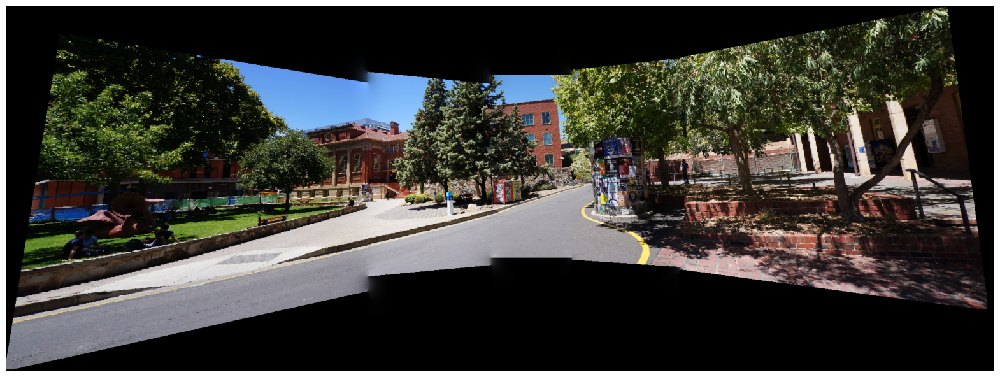

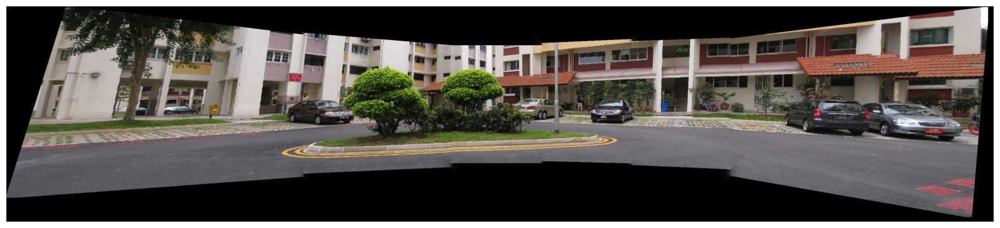

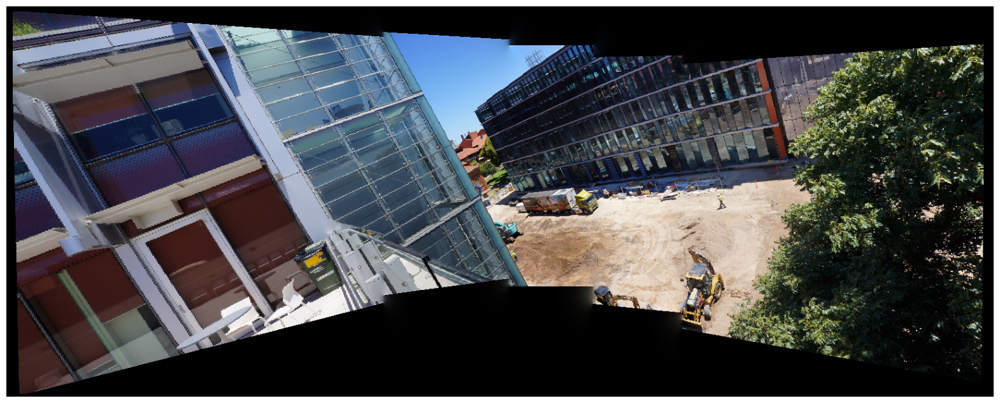

In [41]:
print_big("outputs/l4/FAST_Harris/FINALBLENDED.png")
print_big("outputs/l1/FAST_Harris/FINALBLENDED.png")
print_big("outputs/l5/FAST_Harris/FINALBLENDED.png")

In [43]:
%%writefile main_patch_descriptor.py
from blending import Blender
import glob
import cv2
import numpy as np
import os
from tqdm import tqdm
import argparse

def extractPatchDescriptor(img, kp, patch_size=16):
    '''
    Extracts a patch descriptor for each keypoint from the image.
    '''
    descriptors = []
    for point in kp:
        x, y = int(point.pt[0]), int(point.pt[1])
        patch = img[max(0, y-patch_size//2):min(y+patch_size//2, img.shape[0]),
                    max(0, x-patch_size//2):min(x+patch_size//2, img.shape[1])]
        patch = cv2.resize(patch, (patch_size, patch_size))  # Resize to fixed size if needed
        descriptors.append(patch.flatten())  # Flatten the patch into a 1D array
    return np.array(descriptors)

def detectFeaturesAndMatch(img1, img2, nFeaturesReturn=30):
    '''
    Detects features using SIFT and uses custom patch descriptors for matching.
    '''
    kp1 = sift.detect(img1, None)
    kp2 = sift.detect(img2, None)

    des1 = extractPatchDescriptor(img1, kp1)
    des2 = extractPatchDescriptor(img2, kp2)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    correspondences = [(kp1[match.queryIdx].pt, kp2[match.trainIdx].pt) for match in matches]
    print('Totally', len(correspondences), 'matches')

    src = np.float32([m[0] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)
    dst = np.float32([m[1] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)

    return np.array(correspondences[:nFeaturesReturn]), src, dst



def getHomography(matches):
    '''
    Takes in the points of correspondences and returns the homography matrix by
    solving for the best fit transform using SVD.
    '''
    A = np.zeros((2*len(matches), 9))
    for i, match in enumerate(matches):
        src = match[0]
        dst = match[1]
        x1 = src[0]
        x2 = dst[0]
        y1 = src[1]
        y2 = dst[1]
        A[2*i] = np.array([x1, y1, 1, 0, 0, 0, -x1*x2, -y1*x2, -x2])
        A[2*i+1] = np.array([0, 0, 0, x1, y1, 1, -x1*y2, -y1*y2, -y2])

    U, S, V = np.linalg.svd(A)
    H = np.reshape(V[-1], (3, 3) )
    return H

def getBestHomographyRANSAC(matches, trials = 10000, threshold = 10, toChooseSamples = 4):
    '''
    Applies the RANSAC algorithm and tries out different homography matrices to compute the best matrix.
    '''
    finalH = None
    nMaxInliers = 0
    randomSample = None
    for trialIndex in tqdm(range(trials)):
        inliers = []
        # randomly sample from the correspondences, and then compute homography matrix
        # after finding homography, see if the number of inliers is the best so far. If yes, we take that homography.
        # the number of correspondences for which we can compute the homography is a parameter.
        randomSample = matches[np.random.choice(len(matches), size=toChooseSamples, replace=False)]
        H = getHomography(randomSample)
        for match in matches:
            src = np.append(match[0], 1).T
            dst = np.append(match[1], 1).T
            transformed = np.dot(H, src)
            transformed /= transformed[2]
            if np.linalg.norm(transformed - dst) < threshold:
                inliers.append(match)

        # best match => store
        if len(inliers) > nMaxInliers:
            nMaxInliers = len(inliers)
            finalH = H
    print('Max inliers = ', nMaxInliers)
    return finalH, randomSample

def transformPoint(i, j, H):
    '''
    Helper function that simply transforms the point according to a given homography matrix
    '''
    transformed = np.dot(H, np.array([i, j, 1]))
    transformed /= transformed[2]
    transformed = transformed.astype(int)[:2]
    return np.array(transformed)

def transformImage(img, H, dst, forward = False, offset = [0, 0]):
    '''
    Helper function that computes the transformed image after applying homography.
    '''
    h, w, _ = img.shape
    if forward:
        # direct conversion from image to warped image without gap filling.
        coords = np.indices((w, h)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)
        transformedPoints = np.dot(H, coords)
        yo, xo = coords[1, :], coords[0, :]
        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)
        dst[yt + offset[1], xt + offset[0]] = img[yo, xo]
    else:
        # applies inverse sampling to prevent any aliasing and hole effects in output image.
        Hinv = np.linalg.inv(H)
        topLeft = transformPoint(0, 0, H)
        topRight = transformPoint(w-1, 0, H)
        bottomLeft = transformPoint(0, h-1, H)
        bottomRight = transformPoint(w-1, h-1, H)
        box = np.array([topLeft, topRight, bottomLeft, bottomRight])
        minX = np.min(box[:, 0])
        maxX = np.max(box[:, 0])
        minY = np.min(box[:, 1])
        maxY = np.max(box[:, 1])
        # instead of iterating through the pixels, we take indices and do
        # H.C, where C = coordinates to get the transformed pixels.
        coords = np.indices((maxX - minX, maxY - minY)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)

        coords[0, :] += minX
        coords[1, :] += minY
        # here, we use the inverse transformation from the transformed bounding box to compute the pixel value of the transformed image.
        transformedPoints = np.dot(Hinv, coords)
        yo, xo = coords[1, :], coords[0, :]

        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)


        # to prevent out of range errors
        indices = np.where((yt >= 0) & (yt < h) & (xt >= 0) & (xt < w))

        xt = xt[indices]
        yt = yt[indices]

        xo = xo[indices]
        yo = yo[indices]

        height, width = dst.shape[:2]  # Get the dimensions of the destination image

        if (0 <= (yo + offset[1])).all() and (yo + offset[1] < height).all() and \
        (0 <= (xo + offset[0])).all() and (xo + offset[0] < width).all():
            dst[yo + offset[1], xo + offset[0]] = img[yt, xt]


def execute(index1, index2, prevH):
    '''
    Computes the best homography and saves the warped images to the outputs_DOG directory.
    '''
    warpedImage = np.zeros((4192, 8192, 3))
    img1 = cv2.imread(imagePaths[index1])
    img2 = cv2.imread(imagePaths[index2])
    print('Original image size = ', img1.shape)
    img1 = cv2.resize(img1, shape)
    img2 = cv2.resize(img2, shape)

    # Feature detection and matching using DoG-based SIFT
    matches, src, dst = detectFeaturesAndMatch(img2, img1)

    # RANSAC for homography
    H, subsetMatches = getBestHomographyRANSAC(matches, trials=trials, threshold=threshold)
    prevH = np.dot(prevH, H)

    # Apply the homography transformation
    transformImage(img2, prevH, dst=warpedImage, offset=offset)

    # Save the warped image in the outputs_DOG directory
    cv2.imwrite(f'outputs/l{imageSet}/Custom_Patch_Descriptor/warped_{index2}.png', warpedImage)

    return prevH



if __name__ == "__main__":
    parser = argparse.ArgumentParser(description="Panorama Stitching Script")

    # Add an argument for the image set number
    parser.add_argument('imageSet', type=int, help="The image set number to process")

    # Parse the arguments
    args = parser.parse_args()

    # Assign the image set number from the argument
    imageSet = args.imageSet

    imagePaths = sorted(glob.glob('dataset/I' + str(imageSet) + '/*'))
    # Update paths to 'outputs_DOG'
    os.makedirs(f'outputs/l{imageSet}/Custom_Patch_Descriptor', exist_ok=True)

    sift = cv2.SIFT_create()
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    shape = (600, 400) # Resize for performance
    mid = len(imagePaths) // 2

    threshold = 2
    trials = 5000
    offset = [2300, 800]

    prevH = np.eye(3)
    prevH = execute(2, 1, prevH)
    prevH = execute(1, 0, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 2, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 3, prevH)
    prevH = execute(3, 4, prevH)

    if imageSet == 1:
        prevH = execute(4, 5, prevH)

    # Blending
    b = Blender()
    finalImg = cv2.imread(f'outputs/l{imageSet}/Custom_Patch_Descriptor/warped_0.png')
    length = 6 if imageSet == 1 else 5
    for index in range(1, length):
        print('Blending', index)
        img2 = cv2.imread(f'outputs/l{imageSet}/Custom_Patch_Descriptor/warped_{index}.png')
        finalImg, mask1truth, mask2truth = b.blend(finalImg, img2)
        mask1truth = mask1truth + mask2truth

    cv2.imwrite(f'outputs/l{imageSet}/Custom_Patch_Descriptor/FINALBLENDED.png', finalImg)



Writing main_patch_descriptor.py


In [44]:
!python main_patch_descriptor.py 4

Original image size =  (1329, 2000, 3)
Totally 606 matches
100% 5000/5000 [00:02<00:00, 1902.51it/s]
Max inliers =  24
Original image size =  (1329, 2000, 3)
Totally 239 matches
100% 5000/5000 [00:02<00:00, 1869.70it/s]
Max inliers =  15
Original image size =  (1329, 2000, 3)
Totally 2122 matches
100% 5000/5000 [00:02<00:00, 1735.77it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 624 matches
100% 5000/5000 [00:02<00:00, 1862.73it/s]
Max inliers =  26
Original image size =  (1329, 2000, 3)
Totally 350 matches
100% 5000/5000 [00:03<00:00, 1286.18it/s]
Max inliers =  20
Blending 1
Blending 2
Blending 3
Blending 4


In [46]:
!python main_patch_descriptor.py 1

Original image size =  (2448, 3264, 3)
Totally 292 matches
100% 5000/5000 [00:02<00:00, 1878.96it/s]
Max inliers =  10
Original image size =  (2448, 3264, 3)
Totally 220 matches
100% 5000/5000 [00:02<00:00, 1906.05it/s]
Max inliers =  24
Original image size =  (2448, 3264, 3)
Totally 1348 matches
100% 5000/5000 [00:02<00:00, 1923.86it/s]
Max inliers =  30
Original image size =  (2448, 3264, 3)
Totally 273 matches
100% 5000/5000 [00:03<00:00, 1292.73it/s]
Max inliers =  18
Original image size =  (2448, 3264, 3)
Totally 305 matches
100% 5000/5000 [00:02<00:00, 1919.73it/s]
Max inliers =  23
Original image size =  (2448, 3264, 3)
Totally 217 matches
100% 5000/5000 [00:03<00:00, 1282.21it/s]
Max inliers =  20
Blending 1
Blending 2
Blending 3
Blending 4
Blending 5


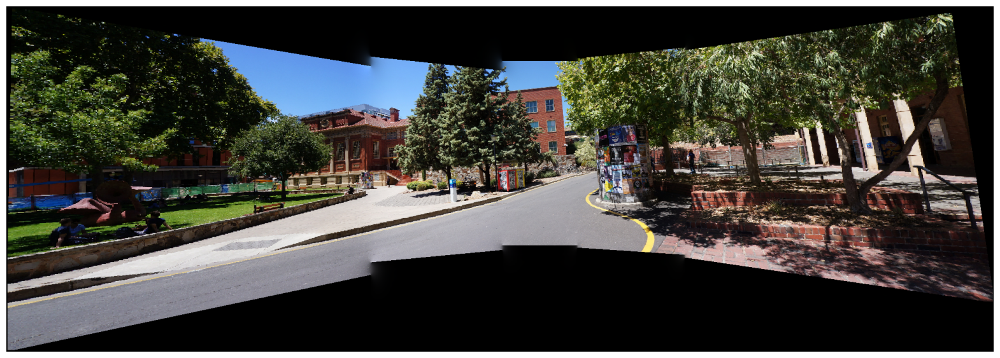

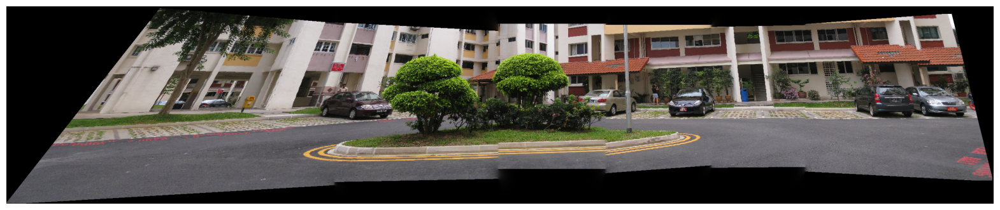

In [49]:
print_big("outputs/l4/Custom_Patch_Descriptor/FINALBLENDED.png")
print_big("outputs/l1/Custom_Patch_Descriptor/FINALBLENDED.png")


In [52]:
%%writefile main_nndr.py
from blending import Blender
import glob
import cv2
import numpy as np
import os
from tqdm import tqdm
from scipy.spatial import KDTree
import argparse


def extractPatchDescriptor(img, kp, patch_size=16):
    '''
    Extracts a patch descriptor for each keypoint from the image.
    '''
    descriptors = []
    for point in kp:
        x, y = int(point.pt[0]), int(point.pt[1])
        patch = img[max(0, y-patch_size//2):min(y+patch_size//2, img.shape[0]),
                    max(0, x-patch_size//2):min(x+patch_size//2, img.shape[1])]
        patch = cv2.resize(patch, (patch_size, patch_size))  # Resize to fixed size if needed
        descriptors.append(patch.flatten())  # Flatten the patch into a 1D array
    return np.array(descriptors)


def detectFeaturesAndMatch(img1, img2, nFeaturesReturn=30, ratio_thresh=0.75):
    '''
    Detects features using SIFT and uses KDTree for nearest neighbor search with NNDR for matching.
    '''
    kp1 = sift.detect(img1, None)
    kp2 = sift.detect(img2, None)

    des1 = extractPatchDescriptor(img1, kp1)
    des2 = extractPatchDescriptor(img2, kp2)

    # Build KD Tree for fast nearest neighbor search on des2
    kd_tree = KDTree(des2)

    # Find nearest and second nearest neighbors
    correspondences = []
    for i, descriptor in enumerate(des1):
        # Query the two nearest neighbors
        dists, idxs = kd_tree.query(descriptor, k=2)

        # Apply NNDR (Nearest Neighbor Distance Ratio)
        if dists[0] < ratio_thresh * dists[1]:
            # If the distance ratio is below the threshold, consider this a valid match
            pt1 = kp1[i].pt
            pt2 = kp2[idxs[0]].pt
            correspondences.append((pt1, pt2))

    print('Totally', len(correspondences), 'matches after NNDR filtering')

    # Sort matches by distance and return top nFeaturesReturn
    correspondences = sorted(correspondences, key=lambda x: np.linalg.norm(np.array(x[0]) - np.array(x[1])))

    src = np.float32([m[0] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)
    dst = np.float32([m[1] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)

    return np.array(correspondences[:nFeaturesReturn]), src, dst




def getHomography(matches):
    '''
    Takes in the points of correspondences and returns the homography matrix by
    solving for the best fit transform using SVD.
    '''
    A = np.zeros((2*len(matches), 9))
    for i, match in enumerate(matches):
        src = match[0]
        dst = match[1]
        x1 = src[0]
        x2 = dst[0]
        y1 = src[1]
        y2 = dst[1]
        A[2*i] = np.array([x1, y1, 1, 0, 0, 0, -x1*x2, -y1*x2, -x2])
        A[2*i+1] = np.array([0, 0, 0, x1, y1, 1, -x1*y2, -y1*y2, -y2])

    U, S, V = np.linalg.svd(A)
    H = np.reshape(V[-1], (3, 3) )
    return H

def getBestHomographyRANSAC(matches, trials = 10000, threshold = 10, toChooseSamples = 4):
    '''
    Applies the RANSAC algorithm and tries out different homography matrices to compute the best matrix.
    '''
    finalH = None
    nMaxInliers = 0
    randomSample = None
    for trialIndex in tqdm(range(trials)):
        inliers = []
        # randomly sample from the correspondences, and then compute homography matrix
        # after finding homography, see if the number of inliers is the best so far. If yes, we take that homography.
        # the number of correspondences for which we can compute the homography is a parameter.
        randomSample = matches[np.random.choice(len(matches), size=toChooseSamples, replace=False)]
        H = getHomography(randomSample)
        for match in matches:
            src = np.append(match[0], 1).T
            dst = np.append(match[1], 1).T
            transformed = np.dot(H, src)
            transformed /= transformed[2]
            if np.linalg.norm(transformed - dst) < threshold:
                inliers.append(match)

        # best match => store
        if len(inliers) > nMaxInliers:
            nMaxInliers = len(inliers)
            finalH = H
    print('Max inliers = ', nMaxInliers)
    return finalH, randomSample

def transformPoint(i, j, H):
    '''
    Helper function that simply transforms the point according to a given homography matrix
    '''
    transformed = np.dot(H, np.array([i, j, 1]))
    transformed /= transformed[2]
    transformed = transformed.astype(int)[:2]
    return np.array(transformed)

def transformImage(img, H, dst, forward = False, offset = [0, 0]):
    '''
    Helper function that computes the transformed image after applying homography.
    '''
    h, w, _ = img.shape
    if forward:
        # direct conversion from image to warped image without gap filling.
        coords = np.indices((w, h)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)
        transformedPoints = np.dot(H, coords)
        yo, xo = coords[1, :], coords[0, :]
        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)
        dst[yt + offset[1], xt + offset[0]] = img[yo, xo]
    else:
        # applies inverse sampling to prevent any aliasing and hole effects in output image.
        Hinv = np.linalg.inv(H)
        topLeft = transformPoint(0, 0, H)
        topRight = transformPoint(w-1, 0, H)
        bottomLeft = transformPoint(0, h-1, H)
        bottomRight = transformPoint(w-1, h-1, H)
        box = np.array([topLeft, topRight, bottomLeft, bottomRight])
        minX = np.min(box[:, 0])
        maxX = np.max(box[:, 0])
        minY = np.min(box[:, 1])
        maxY = np.max(box[:, 1])
        # instead of iterating through the pixels, we take indices and do
        # H.C, where C = coordinates to get the transformed pixels.
        coords = np.indices((maxX - minX, maxY - minY)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)

        coords[0, :] += minX
        coords[1, :] += minY
        # here, we use the inverse transformation from the transformed bounding box to compute the pixel value of the transformed image.
        transformedPoints = np.dot(Hinv, coords)
        yo, xo = coords[1, :], coords[0, :]

        # projective transform. Output's 3rd index should be one to convert to cartesian coords.
        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)


        # to prevent out of range errors
        indices = np.where((yt >= 0) & (yt < h) & (xt >= 0) & (xt < w))

        xt = xt[indices]
        yt = yt[indices]

        xo = xo[indices]
        yo = yo[indices]

        height, width = dst.shape[:2]  # Get the dimensions of the destination image

        if (0 <= (yo + offset[1])).all() and (yo + offset[1] < height).all() and \
        (0 <= (xo + offset[0])).all() and (xo + offset[0] < width).all():
            dst[yo + offset[1], xo + offset[0]] = img[yt, xt]


def execute(index1, index2, prevH):
    '''
    Computes the best homography and saves the warped images to the outputs_DOG directory.
    '''
    warpedImage = np.zeros((4192, 8192, 3))
    img1 = cv2.imread(imagePaths[index1])
    img2 = cv2.imread(imagePaths[index2])
    print('Original image size = ', img1.shape)
    img1 = cv2.resize(img1, shape)
    img2 = cv2.resize(img2, shape)

    # Feature detection and matching using DoG-based SIFT
    matches, src, dst = detectFeaturesAndMatch(img2, img1)

    # RANSAC for homography
    H, subsetMatches = getBestHomographyRANSAC(matches, trials=trials, threshold=threshold)
    prevH = np.dot(prevH, H)

    # Apply the homography transformation
    transformImage(img2, prevH, dst=warpedImage, offset=offset)

    # Save the warped image in the outputs_DOG directory
    cv2.imwrite(f'outputs/l{imageSet}/NNDR/warped_{index2}.png', warpedImage)

    return prevH



if __name__ == "__main__":
    parser = argparse.ArgumentParser(description="Panorama Stitching Script")

    # Add an argument for the image set number
    parser.add_argument('imageSet', type=int, help="The image set number to process")

    # Parse the arguments
    args = parser.parse_args()

    # Assign the image set number from the argument
    imageSet = args.imageSet

    imagePaths = sorted(glob.glob('dataset/I' + str(imageSet) + '/*'))
    # Update paths to 'outputs_DOG'
    os.makedirs(f'outputs/l{imageSet}/NNDR', exist_ok=True)

    sift = cv2.SIFT_create()
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    shape = (600, 400) # Resize for performance
    mid = len(imagePaths) // 2

    threshold = 2
    trials = 5000
    offset = [2300, 800]

    prevH = np.eye(3)
    prevH = execute(2, 1, prevH)
    prevH = execute(1, 0, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 2, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 3, prevH)
    prevH = execute(3, 4, prevH)

    if imageSet == 1:
        prevH = execute(4, 5, prevH)

    # Blending
    b = Blender()
    finalImg = cv2.imread(f'outputs/l{imageSet}/NNDR/warped_0.png')
    length = 6 if imageSet == 1 else 5
    for index in range(1, length):
        print('Blending', index)
        img2 = cv2.imread(f'outputs/l{imageSet}/NNDR/warped_{index}.png')
        finalImg, mask1truth, mask2truth = b.blend(finalImg, img2)
        mask1truth = mask1truth + mask2truth

    cv2.imwrite(f'outputs/l{imageSet}/NNDR/FINALBLENDED.png', finalImg)



Overwriting main_nndr.py


In [53]:
! python main_nndr.py 4

Original image size =  (1329, 2000, 3)
Totally 284 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1917.58it/s]
Max inliers =  20
Original image size =  (1329, 2000, 3)
Totally 44 matches after NNDR filtering
100% 5000/5000 [00:04<00:00, 1248.30it/s]
Max inliers =  21
Original image size =  (1329, 2000, 3)
Totally 1665 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1872.05it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 221 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1875.02it/s]
Max inliers =  29
Original image size =  (1329, 2000, 3)
Totally 105 matches after NNDR filtering
100% 5000/5000 [00:03<00:00, 1596.20it/s]
Max inliers =  29
Blending 1
Blending 2
Blending 3
Blending 4


In [56]:
! python main_nndr.py 5

Original image size =  (1329, 2000, 3)
Totally 154 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1802.11it/s]
Max inliers =  29
Original image size =  (1329, 2000, 3)
Totally 143 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1906.90it/s]
Max inliers =  17
Original image size =  (1329, 2000, 3)
Totally 1176 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1934.16it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 89 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1894.66it/s]
Max inliers =  26
Original image size =  (1329, 2000, 3)
Totally 205 matches after NNDR filtering
100% 5000/5000 [00:02<00:00, 1940.51it/s]
Max inliers =  28
Blending 1
Blending 2
Blending 3
Blending 4


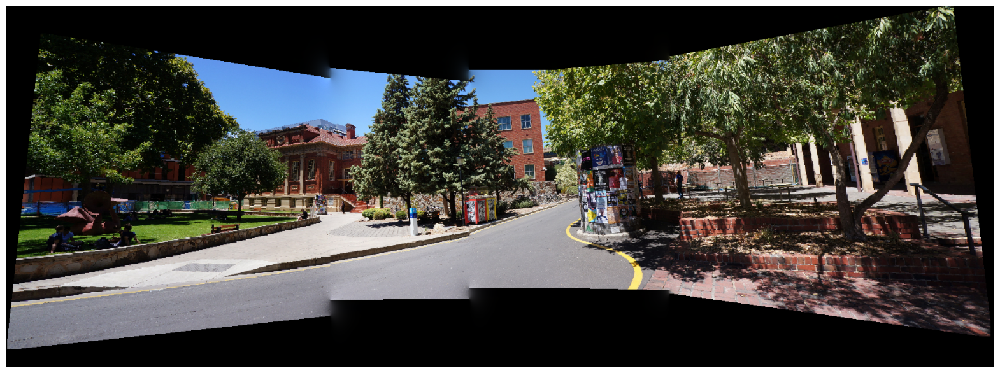

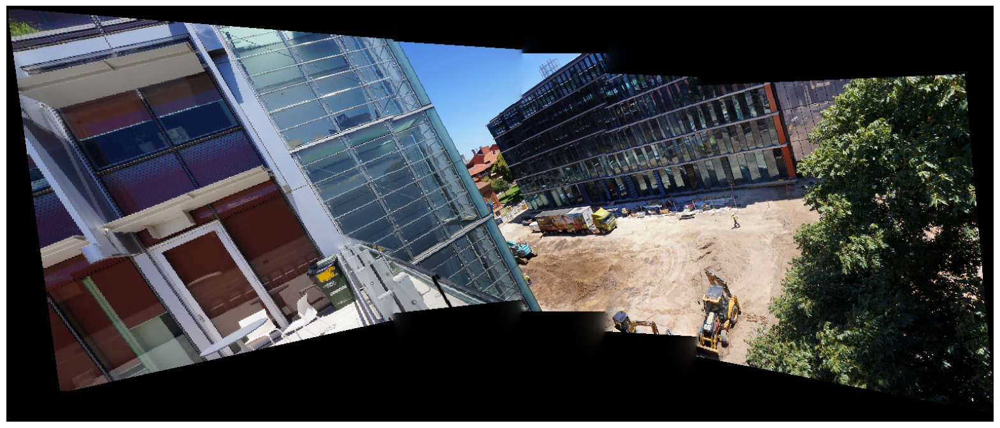

In [60]:
print_big("outputs/l4/NNDR/FINALBLENDED.png")
print_big("outputs/l5/NNDR/FINALBLENDED.png")

In [57]:
%%writefile main_geometric_minimization.py
from blending import Blender
import glob
import cv2
import numpy as np
import os
from tqdm import tqdm
import argparse

def detectFeaturesAndMatch(img1, img2, nFeaturesReturn=30):
    '''
    Uses SIFT for feature detection and BFMatcher for feature matching.
    '''
    # Initialize SIFT detector (using DoG)
    sift = cv2.SIFT_create()

    # Detect keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # Brute force matcher with L2 norm (recommended for SIFT)
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    # Match descriptors
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    correspondences = []
    for match in matches:
        correspondences.append((kp1[match.queryIdx].pt, kp2[match.trainIdx].pt))

    print('Totally', len(correspondences), 'matches')

    src = np.float32([m[0] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)
    dst = np.float32([m[1] for m in correspondences[:nFeaturesReturn]]).reshape(-1, 1, 2)

    return np.array(correspondences[:nFeaturesReturn]), src, dst


def getHomography(matches):
    '''
    Takes in the points of correspondences and returns the homography matrix by
    solving for the best fit transform using SVD.
    '''
    A = np.zeros((2*len(matches), 9))
    for i, match in enumerate(matches):
        src = match[0]
        dst = match[1]
        x1 = src[0]
        x2 = dst[0]
        y1 = src[1]
        y2 = dst[1]
        A[2*i] = np.array([x1, y1, 1, 0, 0, 0, -x1*x2, -y1*x2, -x2])
        A[2*i+1] = np.array([0, 0, 0, x1, y1, 1, -x1*y2, -y1*y2, -y2])

    U, S, V = np.linalg.svd(A)
    H = np.reshape(V[-1], (3, 3))
    return H


def geometricMinimization(matches, initialH, threshold=10):
    '''
    Refines the homography matrix using geometric minimization based on the inlier matches.
    '''
    inliers = []
    for match in matches:
        src = np.append(match[0], 1).T
        dst = np.append(match[1], 1).T
        transformed = np.dot(initialH, src)
        transformed /= transformed[2]
        if np.linalg.norm(transformed - dst) < threshold:
            inliers.append(match)

    if len(inliers) < 4:
        print("Not enough inliers for geometric minimization.")
        return initialH

    # Compute refined homography from the inliers
    refinedH = getHomography(inliers)
    return refinedH


def getBestHomographyRANSAC(matches, trials=10000, threshold=10, toChooseSamples=4):
    '''
    Applies the RANSAC algorithm and tries out different homography matrices to compute the best matrix.
    '''
    finalH = None
    nMaxInliers = 0
    randomSample = None
    for trialIndex in tqdm(range(trials)):
        inliers = []
        # randomly sample from the correspondences, and then compute homography matrix
        randomSample = matches[np.random.choice(len(matches), size=toChooseSamples, replace=False)]
        H = getHomography(randomSample)
        for match in matches:
            src = np.append(match[0], 1).T
            dst = np.append(match[1], 1).T
            transformed = np.dot(H, src)
            transformed /= transformed[2]
            if np.linalg.norm(transformed - dst) < threshold:
                inliers.append(match)

        # best match => store
        if len(inliers) > nMaxInliers:
            nMaxInliers = len(inliers)
            finalH = H

    print('Max inliers = ', nMaxInliers)

    # Refine using geometric minimization
    finalH = geometricMinimization(matches, finalH, threshold)

    return finalH, randomSample


def transformPoint(i, j, H):
    '''
    Helper function that simply transforms the point according to a given homography matrix
    '''
    transformed = np.dot(H, np.array([i, j, 1]))
    transformed /= transformed[2]
    transformed = transformed.astype(int)[:2]
    return np.array(transformed)


def transformImage(img, H, dst, forward=False, offset=[0, 0]):
    '''
    Helper function that computes the transformed image after applying homography.
    '''
    h, w, _ = img.shape
    if forward:
        # direct conversion from image to warped image without gap filling.
        coords = np.indices((w, h)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)
        transformedPoints = np.dot(H, coords)
        yo, xo = coords[1, :], coords[0, :]

        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)
        dst[yt + offset[1], xt + offset[0]] = img[yo, xo]
    else:
        # applies inverse sampling to prevent any aliasing and hole effects in output image.
        Hinv = np.linalg.inv(H)
        topLeft = transformPoint(0, 0, H)
        topRight = transformPoint(w-1, 0, H)
        bottomLeft = transformPoint(0, h-1, H)
        bottomRight = transformPoint(w-1, h-1, H)
        box = np.array([topLeft, topRight, bottomLeft, bottomRight])
        minX = np.min(box[:, 0])
        maxX = np.max(box[:, 0])
        minY = np.min(box[:, 1])
        maxY = np.max(box[:, 1])

        coords = np.indices((maxX - minX, maxY - minY)).reshape(2, -1)
        coords = np.vstack((coords, np.ones(coords.shape[1]))).astype(int)

        coords[0, :] += minX
        coords[1, :] += minY
        transformedPoints = np.dot(Hinv, coords)
        yo, xo = coords[1, :], coords[0, :]

        yt = np.divide(np.array(transformedPoints[1, :]),np.array(transformedPoints[2, :])).astype(int)
        xt = np.divide(np.array(transformedPoints[0, :]),np.array(transformedPoints[2, :])).astype(int)

        indices = np.where((yt >= 0) & (yt < h) & (xt >= 0) & (xt < w))

        xt = xt[indices]
        yt = yt[indices]

        xo = xo[indices]
        yo = yo[indices]

        height, width = dst.shape[:2]  # Get the dimensions of the destination image

        if (0 <= (yo + offset[1])).all() and (yo + offset[1] < height).all() and \
        (0 <= (xo + offset[0])).all() and (xo + offset[0] < width).all():
            dst[yo + offset[1], xo + offset[0]] = img[yt, xt]


def execute(index1, index2, prevH):
    '''
    Computes the best homography and saves the warped images to the outputs_DOG directory.
    '''
    warpedImage = np.zeros((4192, 8192, 3))
    img1 = cv2.imread(imagePaths[index1])
    img2 = cv2.imread(imagePaths[index2])
    print('Original image size = ', img1.shape)
    img1 = cv2.resize(img1, shape)
    img2 = cv2.resize(img2, shape)

    # Feature detection and matching using DoG-based SIFT
    matches, src, dst = detectFeaturesAndMatch(img2, img1)

    # RANSAC for homography
    H, subsetMatches = getBestHomographyRANSAC(matches, trials=trials, threshold=threshold)
    prevH = np.dot(prevH, H)

    # Apply the homography transformation
    transformImage(img2, prevH, dst=warpedImage, offset=offset)

    # Save the warped image in the outputs_DOG directory
    cv2.imwrite(f'outputs/l{imageSet}/Geometric_minimization/warped_{index2}.png', warpedImage)

    return prevH


if __name__ == "__main__":
    parser = argparse.ArgumentParser(description="Panorama Stitching Script")

    # Add an argument for the image set number
    parser.add_argument('imageSet', type=int, help="The image set number to process")

    # Parse the arguments
    args = parser.parse_args()

    # Assign the image set number from the argument
    imageSet = args.imageSet

    imagePaths = sorted(glob.glob('dataset/I' + str(imageSet) + '/*'))
    # Update paths to 'outputs_Geometric_minimization'
    os.makedirs(f'outputs/l{imageSet}/Geometric_minimization', exist_ok=True)

    shape = (600, 400) # Resize for performance
    mid = len(imagePaths) // 2

    threshold = 2
    trials = 5000
    offset = [2300, 800]

    prevH = np.eye(3)
    prevH = execute(2, 1, prevH)
    prevH = execute(1, 0, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 2, prevH)

    prevH = np.eye(3)
    prevH = execute(2, 3, prevH)
    prevH = execute(3, 4, prevH)

    if imageSet == 1:
        prevH = execute(4, 5, prevH)

    # Blending
    b = Blender()
    finalImg = cv2.imread(f'outputs/l{imageSet}/Geometric_minimization/warped_0.png')
    length = 6 if imageSet == 1 else 5
    for index in range(1, length):
        print('Blending', index)
        img2 = cv2.imread(f'outputs/l{imageSet}/Geometric_minimization/warped_{index}.png')
        finalImg, mask1truth, mask2truth = b.blend(finalImg, img2)
        mask1truth = mask1truth + mask2truth

    cv2.imwrite(f'outputs/l{imageSet}/Geometric_minimization/FINALBLENDED.png', finalImg)


Writing main_geometric_minimization.py


In [58]:
!python main_geometric_minimization.py 4

Original image size =  (1329, 2000, 3)
Totally 1059 matches
100% 5000/5000 [00:06<00:00, 719.26it/s] 
Max inliers =  25
Original image size =  (1329, 2000, 3)
Totally 804 matches
100% 5000/5000 [00:04<00:00, 1055.30it/s]
Max inliers =  25
Original image size =  (1329, 2000, 3)
Totally 2625 matches
100% 5000/5000 [00:05<00:00, 997.86it/s] 
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 1198 matches
100% 5000/5000 [00:02<00:00, 1873.81it/s]
Max inliers =  30
Original image size =  (1329, 2000, 3)
Totally 1179 matches
100% 5000/5000 [00:04<00:00, 1205.02it/s]
Max inliers =  25
Blending 1
Blending 2
Blending 3
Blending 4


In [ ]:
!python main_geometric_minimization.py 1

In [ ]:
!python main_geometric_minimization.py 5

In [ ]:
print_big("outputs/l4/Geometric_minimization/FINALBLENDED.png")
print_big("outputs/l1/Geometric_minimization/FINALBLENDED.png")
print_big("outputs/l5/Geometric_minimization/FINALBLENDED.png")